# Package Imports

In [1]:
import pandas as pd
import plotly.express as px
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, normalize,OneHotEncoder
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
import numpy as np
from scipy.stats import normaltest
import os
from sklearn.tree import DecisionTreeRegressor
from statsmodels.tsa.stattools import adfuller
import warnings
import seaborn as sns
warnings.filterwarnings(action="ignore")
import time
from sklearn.preprocessing import StandardScaler
from itertools import permutations,combinations 
from datetime import datetime
from sklearn.linear_model import Lasso,Ridge
import statsmodels.api as stm
from sklearn import datasets, linear_model, metrics ,preprocessing
from statsmodels.stats.outliers_influence import variance_inflation_factor
from functools import reduce
from regressors import stats
from itertools import permutations, combinations
from joblib import Parallel,delayed
from sklearn.model_selection import train_test_split 
import math
from datetime import datetime
from matplotlib import pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
import pmdarima as pm
from sklearn.metrics import make_scorer 
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
os.chdir(r'C:/Users/thambu/Downloads/HSBC_project/')

In [2]:
from scipy.stats import kstest 

# Reading the dataset

In [3]:
Final=pd.read_csv("Final_workingdataset.csv")
Final=Final.drop(columns=['Unnamed: 0', 'Unnamed: 0.1'],axis=1)
#Final["Avgprice*totalvolume"]=Final["AveragePrice"]*Final["Total Volume"]
#wm = lambda x: np.average(x, weights=Final.loc[x.index, "Total Volume"])
#f = {'Total Volume': ['sum'], 'AveragePrice': {'weighted_mean' : wm} }

In [4]:
#stats.ks(Final["Total Volume"][Final.region=="Orlando"],'norm')

In [5]:
Final=Final[~Final.region.isin(['West','Northeast','TotalUS','Plains','West','SouthCentral','Southeast','Midsouth'])].reset_index(drop=True)

In [6]:
#Summary_Df=Final.groupby(["mon_year","co-ordinates","region"])["Total Volume"].describe().reset_index()
#Summary_Df
fig=px.scatter_matrix(Final,dimensions=['AveragePrice', 'Total Volume', '4046', '4225', '4770',
       'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags'],color='type',size_max=10,height=800,width=400)
fig.show()

In [7]:
order = (
    Final[(Final.type=="conventional") & (Final['year']==2018)]
    .groupby('region')['Total Volume']
    .mean()
    .sort_values()
    .index
)

Text(0.5, 1, 'Conventional Volume distribution across states')

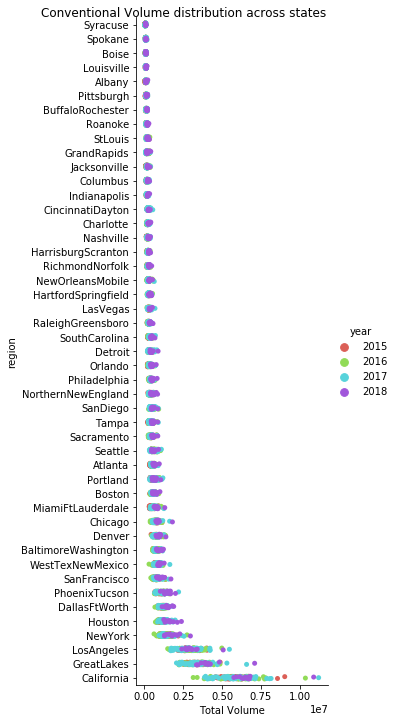

In [8]:
g = sns.catplot('Total Volume','region',data=Final[(Final.type=="conventional")],hue='year',
                   size=10,
                   aspect=0.5,
                   palette='hls',
                order=order
              )
g.fig.suptitle("Conventional Volume distribution across states",x=0.5,y=1)


Text(0.5, 1, 'Organic Volume distribution across states')

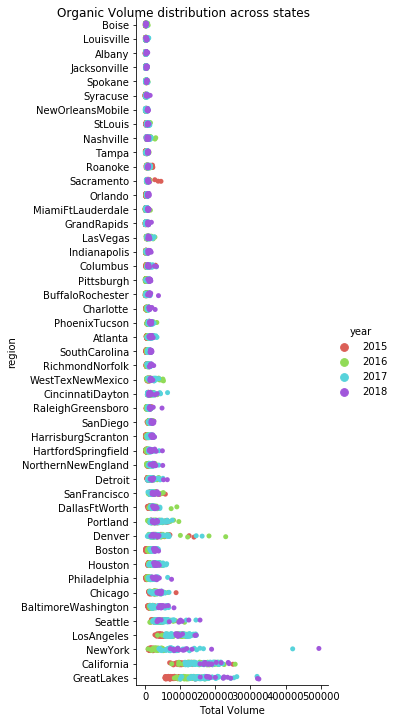

In [9]:
order = (
    Final[(Final.type=="organic") & (Final['year']==2018)]
    .groupby('region')['Total Volume']
    .mean()
    .sort_values()
    .index
)
g1 = sns.catplot('Total Volume','region',data=Final[(Final.type=="organic")],hue='year',
                   size=10,
                   aspect=0.5,
                   palette='hls',order=order
              )
g1.fig.suptitle("Organic Volume distribution across states",x=0.5,y=1)

In [10]:
#Final=Final[Final.type==1]
#Final["Categories"]=pd.cut(np.array(Final["Total Volume"]),5,labels=["Class1","Class2","Class3","Class4","Class5"])

In [11]:
Final["Year"]=Final.Date.str[0:4]


In [12]:
Final=Final.sort_values(by="Date").reset_index(drop=True)

In [13]:
Final["Total bags_shift1"]=Final.groupby(["type","region"])["Total Bags"].shift(1)
Final["Total bags_shift2"]=Final.groupby(["type","region"])["Total Bags"].shift(2)

In [14]:
#Final["Total bags_diff"]=Final.groupby(["type","region"])["Total Bags"].diff()

In [15]:
Final["Month"]=Final.Date.str[-5:-3]

In [16]:
Final["week"]=pd.to_datetime(Final['Date']).apply(lambda x: x.strftime("%V"))

In [17]:
dummies=pd.get_dummies(Final["week"],prefix="week",drop_first=True)
dummies1=pd.get_dummies(Final["Month"],prefix="Month",drop_first=True)
dummies2=pd.get_dummies(Final["Year"],prefix="Year",drop_first=True)

In [18]:
Final=pd.concat([Final,dummies,dummies1],axis=1)

In [20]:
#Final["Small Bags_shift1"]=Final.groupby(["type","region"])["Small Bags"].shift(1)
#Final["Small bags_diff"]=Final.groupby(["type","region"])["Small Bags"].diff()

In [21]:
#Final["Large Bags_shift1"]=Final.groupby(["type","region"])["Large Bags"].shift(1)
#Final["Large Bags_diff"]=Final.groupby(["type","region"])["Large Bags"].diff()

In [22]:
#Final["XLarge Bags_shift1"]=Final.groupby(["type","region"])["XLarge Bags"].shift(1)
#Final["XLarge Bags_diff1"]=Final.groupby(["type","region"])["XLarge Bags"].diff()

In [23]:
#Final["4046_shift1"]=Final.groupby(["type","region"])["4046"].shift(1)
#Final["4046_diff"]=Final.groupby(["type","region"])["4046"].diff()

In [24]:
#Final["4225_shift1"]=Final.groupby(["type","region"])["4225"].shift(1)
#Final["4225_diff"]=Final.groupby(["type","region"])["4225"].diff()

In [25]:
#Final["4770_shift1"]=Final.groupby(["type","region"])["4770"].shift(1)
#Final["4770_diff"]=Final.groupby(["type","region"])["4770"].diff()

In [19]:
OOB=Final[13500:]

In [20]:
Final=Final[0:13500]

# Consumer Segmentation based on Sales across 3 years

In [21]:
from sklearn.cluster import SpectralClustering
from sklearn.decomposition import PCA

# Finding possible clusters for conventional

In [22]:
Analysis=Final[["region","Total Volume","type"]].sort_values(['type','region'])
Analysis.describe()

,Total Volume
count,1.350000e+04
mean,3.374845e+05
std,7.961090e+05
min,8.456000e+01
25%,8.361595e+03
50%,7.774873e+04
75%,3.295898e+05
max,1.121360e+07


In [23]:
List=[]
for i in (list(Analysis.region.unique())):
    summary=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="conventional")].describe()[1]
    summary_=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="conventional")].describe()[2]
    summary_1=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="conventional")].describe()[4]
    summary_2=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="conventional")].describe()[5]
    summary_3=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="conventional")].describe()[6]
    #summary_4=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="conventional")].describe()[6]
    #summary_5=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="conventional")].describe()[7]
    meanplus3sd=summary+3*summary_
    meanminus3d=summary-3*summary_
    List.append([summary,summary_,summary_1,summary_2,summary_3,meanplus3sd
                 ,meanminus3d,i])
List=sorted(List)

In [96]:
df=pd.DataFrame(List,columns=["mean","std","Q1","median","Q3","meanplus3sd","meanminus3sd","region"])


In [97]:
df.sort_values(by=["Q1","Q3","median","meanplus3sd","meanminus3sd","std"]).head()

,mean,std,Q1,median,Q3,meanplus3sd,meanminus3sd,region
0,61106.464722,14394.822123,50292.380,61410.37,70266.8650,104290.931090,17921.998354,Syracuse
1,82701.887762,19107.956649,66845.705,80904.19,95107.4250,140025.757709,25378.017816,Boise
3,91001.122708,27304.704207,72950.760,92575.19,106768.6725,172915.235331,9087.010086,Albany
2,89443.966319,22143.802991,74578.810,86586.25,101871.4100,155875.375294,23012.557345,Spokane
4,91131.289371,19500.052440,78267.465,89361.43,102080.1950,149631.446691,32631.132050,Louisville


In [99]:
df.iloc[0:2]

,mean,std,Q1,median,Q3,meanplus3sd,meanminus3sd,region
0,61106.464722,14394.822123,50292.380,61410.37,70266.865,104290.931090,17921.998354,Syracuse
1,82701.887762,19107.956649,66845.705,80904.19,95107.425,140025.757709,25378.017816,Boise


In [100]:
data = np.array(df.iloc[:,0:2]).reshape(-1, 2)
_, i = np.unique(data[:, 0], return_inverse=True)
_, j = np.unique(data[:, 1], return_inverse=True)

In [101]:
import scipy.sparse as ss
incidence = ss.coo_matrix((np.ones_like(i), (i,j)))
adjecency = incidence.T * incidence

adj=np.array(adjecency.todense())

In [102]:
deg=np.diag(adj.sum(axis=1))

In [103]:
Laplacian=deg-adj

In [104]:
vals, vecs = np.linalg.eig(Laplacian)

In [108]:
adj

array([[1, 0, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 1]], dtype=int64)

In [58]:
scaler = StandardScaler() 
X_scaled = scaler.fit_transform(df.iloc[:,:-1]) 
X_normalized = normalize(X_scaled) 
X_normalized = pd.DataFrame(X_normalized) 
pca = PCA(n_components = 3) 
X_principal = pca.fit_transform(X_normalized) 
X_principal = pd.DataFrame(X_principal) 
X_principal.columns = ['P1', 'P2','P3']

In [88]:
from scipy.spatial.distance import pdist, squareform
def getAffinityMatrix(coordinates, k = 7):
    """
    Calculate affinity matrix based on input coordinates matrix and the numeber
    of nearest neighbours.
    
    Apply local scaling based on the k nearest neighbour
        References:
    https://papers.nips.cc/paper/2619-self-tuning-spectral-clustering.pdf
    """
    # calculate euclidian distance matrix
    dists = squareform(pdist(coordinates)) 
    
    # for each row, sort the distances ascendingly and take the index of the 
    #k-th position (nearest neighbour)
    knn_distances = np.sort(dists, axis=0)[k]
    knn_distances = knn_distances[np.newaxis].T
    
    # calculate sigma_i * sigma_j
    local_scale = knn_distances.dot(knn_distances.T)

    affinity_matrix = dists * dists
    affinity_matrix = -affinity_matrix / local_scale
    # divide square distance matrix by local scale
    affinity_matrix[np.where(np.isnan(affinity_matrix))] = 0.0
    # apply exponential
    affinity_matrix = np.exp(affinity_matrix)
    np.fill_diagonal(affinity_matrix, 0)
    return affinity_matrix

In [89]:
getAffinityMatrix(X_normalized,k=7)

array([[0.        , 0.97863992, 0.65086894, ..., 0.        , 0.        ,
        0.        ],
       [0.97863992, 0.        , 0.75613432, ..., 0.        , 0.        ,
        0.        ],
       [0.65086894, 0.75613432, 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.97672046,
        0.98697562],
       [0.        , 0.        , 0.        , ..., 0.97672046, 0.        ,
        0.99568065],
       [0.        , 0.        , 0.        , ..., 0.98697562, 0.99568065,
        0.        ]])

In [90]:
import scipy
from scipy.sparse import csgraph
# from scipy.sparse.linalg import eigsh
from numpy import linalg as LA
def eigenDecomposition(A, plot = True, topK = 5):
    """
    :param A: Affinity matrix
    :param plot: plots the sorted eigen values for visual inspection
    :return A tuple containing:
    - the optimal number of clusters by eigengap heuristic
    - all eigen values
    - all eigen vectors
    
    This method performs the eigen decomposition on a given affinity matrix,
    following the steps recommended in the paper:
    1. Construct the normalized affinity matrix: L = D−1/2ADˆ −1/2.
    2. Find the eigenvalues and their associated eigen vectors
    3. Identify the maximum gap which corresponds to the number of clusters
    by eigengap heuristic
    
    References:
    https://papers.nips.cc/paper/2619-self-tuning-spectral-clustering.pdf
    http://www.kyb.mpg.de/fileadmin/user_upload/files/publications/attachments/Luxburg07_tutorial_4488%5b0%5d.pdf
    """
    L = csgraph.laplacian(A, normed=True)
    n_components = A.shape[0]
    
    # LM parameter : Eigenvalues with largest magnitude (eigs, eigsh), that is, largest eigenvalues in 
    # the euclidean norm of complex numbers.
#     eigenvalues, eigenvectors = eigsh(L, k=n_components, which="LM", sigma=1.0, maxiter=5000)
    eigenvalues, eigenvectors = LA.eig(L)
    
    if plot:
        plt.title('Largest eigen values of input matrix')
        plt.scatter(np.arange(len(eigenvalues)), eigenvalues)
        plt.grid()
        
    # Identify the optimal number of clusters as the index corresponding
    # to the larger gap between eigen values
    index_largest_gap = np.argsort(np.diff(eigenvalues))[::-1][:topK]
    nb_clusters = index_largest_gap + 1
        
    return nb_clusters, eigenvalues, eigenvectors

Optimal number of clusters [ 9 13  6  5 17]


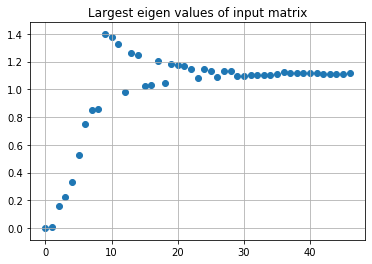

In [91]:
affinity_matrix = getAffinityMatrix(X_normalized, k = 10)
k, _,  _ = eigenDecomposition(affinity_matrix)
print(f'Optimal number of clusters {k}')

In [92]:
Spectre = SpectralClustering(n_clusters=13, affinity='nearest_neighbors',
                           assign_labels='kmeans',random_state=1,n_neighbors=5)
#kmeans.fit(df[["mean","median","std"]])
y_spectre = Spectre.fit_predict(X_normalized)

In [93]:
X_principal["region"]=y_spectre

In [94]:
px.scatter(X_principal,x=X_principal['P1'],y=X_principal['P2'],color='region',title="Conventional Clusters")

In [95]:
df["clusters"]=y_spectre

In [96]:
df=df.sort_values(['clusters'])
df.sort_values(by=["mean","std","Q1","median","Q3","meanplus3sd","meanminus3sd","region"])

,mean,std,Q1,median,Q3,meanplus3sd,meanminus3sd,region,clusters
0,6.110646e+04,1.439482e+04,5.029238e+04,61410.370,7.026686e+04,1.042909e+05,1.792200e+04,Syracuse,4
1,8.270189e+04,1.910796e+04,6.684571e+04,80904.190,9.510743e+04,1.400258e+05,2.537802e+04,Boise,4
2,8.944397e+04,2.214380e+04,7.457881e+04,86586.250,1.018714e+05,1.558754e+05,2.301256e+04,Spokane,11
3,9.100112e+04,2.730470e+04,7.295076e+04,92575.190,1.067687e+05,1.729152e+05,9.087010e+03,Albany,7
4,9.113129e+04,1.950005e+04,7.826746e+04,89361.430,1.020802e+05,1.496314e+05,3.263113e+04,Louisville,4
5,1.025180e+05,3.200049e+04,8.278345e+04,96485.810,1.139474e+05,1.985195e+05,6.516569e+03,Pittsburgh,12
6,1.293694e+05,3.071794e+04,1.075644e+05,132143.530,1.517917e+05,2.215232e+05,3.721553e+04,BuffaloRochester,11
7,1.356570e+05,2.438843e+04,1.162071e+05,139665.325,1.511666e+05,2.088223e+05,6.249170e+04,Roanoke,8
8,1.639076e+05,5.405023e+04,1.279172e+05,152777.160,1.851988e+05,3.260582e+05,1.756871e+03,Jacksonville,2
9,1.655420e+05,4.010780e+04,1.367798e+05,160192.015,1.806974e+05,2.858654e+05,4.521860e+04,Columbus,7


In [97]:
#df.clusters=df.clusters.map({0:"Low consumers",1:"High consumers",2:"Normal consumers"})
dictionary=dict(zip(df["region"],df["clusters"]))

In [98]:
Final.region[Final.type=="conventional"]=Final.region[Final.type=="conventional"].map(dictionary)

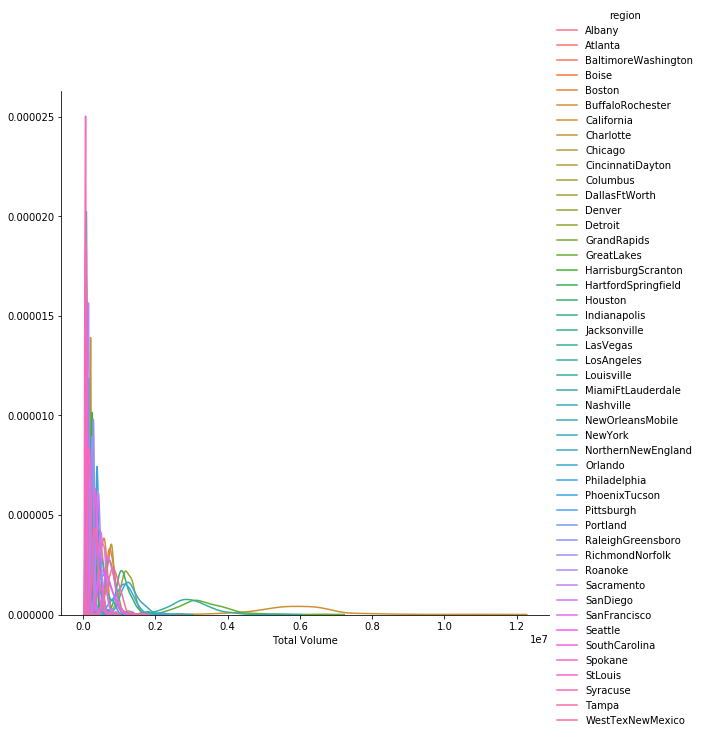

In [99]:
sns.FacetGrid(Analysis[(Analysis.type=="conventional")], hue = "region", size = 8).map(sns.kdeplot, "Total Volume").add_legend()
plt.show()


# Finding Clusters for Organic

In [100]:
List=[]
for i in (list(Analysis.region.unique())):
    summary=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="organic")].describe()[1]
    summary_=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="organic")].describe()[2]
    #summary_1=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="conventional")].describe()[3]
    summary_2=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="organic")].describe()[4]
    summary_3=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="organic")].describe()[5]
    summary_4=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="organic")].describe()[6]
    meanplus3sd=summary+3*summary_
    meanminus3d=summary-3*summary_
    #summary_5=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="conventional")].describe()[7]
    List.append([summary,summary_,summary_2,summary_3,summary_4,meanplus3sd,meanminus3d,i])
List=sorted(List)

In [101]:
df1=pd.DataFrame(List,columns=["mean","std","Q1","median","Q3","meanplus3d",'meanminus3d',"region"])

In [102]:
scaler = StandardScaler() 
X_scaled = scaler.fit_transform(df1.iloc[:,:-1]) 
X_normalized = normalize(X_scaled) 
X_normalized = pd.DataFrame(X_normalized) 
pca = PCA(n_components = 3) 
X_principal = pca.fit_transform(X_normalized) 
X_principal = pd.DataFrame(X_principal) 
X_principal.columns = ['P1', 'P2','P3']

Optimal number of clusters [ 7 12  6  3 15]


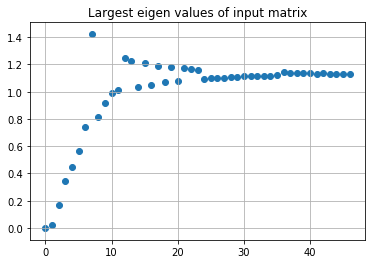

In [103]:
affinity_matrix = getAffinityMatrix(X_normalized, k = 10)
k, _,  _ = eigenDecomposition(affinity_matrix)
print(f'Optimal number of clusters {k}')

In [104]:
Spectre = SpectralClustering(n_clusters=12, affinity='nearest_neighbors',
                           assign_labels='kmeans',random_state=1,n_neighbors=3)
#kmeans.fit(df[["mean","median","std"]])
y_spectre1 = Spectre.fit_predict(X_principal)
y_spectre1

array([ 4,  0,  0,  2,  7,  9,  4,  7,  9,  0,  2,  2, 11,  1,  1,  9, 11,
        7, 11,  2, 10,  1,  1,  2,  1,  4, 10,  1,  8, 10,  1,  1, 10,  8,
        4,  5,  5,  6,  5,  6,  3,  5,  3,  5,  3,  3,  6])

In [105]:
X_principal["region"]=y_spectre1

In [106]:
df1["clusters"]=y_spectre1
df1=df1.sort_values(['clusters'])
df1

,mean,std,Q1,median,Q3,meanplus3d,meanminus3d,region,clusters
1,2178.571944,1239.224180,1284.7675,1918.130,2807.3750,5896.244485,-1539.100596,Syracuse,0
2,2463.612778,1331.859352,1454.1075,2177.080,3087.7525,6459.190833,-1531.965278,Boise,0
9,3758.633611,1933.677599,2096.8425,3620.860,4999.9875,9559.666408,-2042.399186,Tampa,0
21,8183.459580,3386.817245,5171.1800,8170.130,10777.0950,18343.911316,-1976.992155,RichmondNorfolk,1
24,8419.398472,3461.113323,5618.3700,7967.105,10763.2450,18802.738441,-1963.941497,RaleighGreensboro,1
27,11044.539792,4439.452026,8023.2025,9855.655,13185.9650,24362.895869,-2273.816285,NorthernNewEngland,1
14,6188.104825,2622.749057,3860.7950,5664.830,8599.8250,14056.351995,-1680.142345,Charlotte,1
13,4828.945944,1912.242603,3049.7000,4640.870,6229.7600,10565.673753,-907.781865,Orlando,1
31,13804.829028,4173.700204,10453.6875,12861.020,16976.0725,26325.929638,1283.728417,SanDiego,1
22,8233.807222,3670.847069,5835.5975,7567.035,9755.7725,19246.348429,-2778.733984,Roanoke,1


In [107]:
px.scatter(X_principal,x=X_principal['P1'],y=X_principal['P2'],color='region',title="Organic Clusters")

In [108]:
#df.clusters=df.clusters.map({0:"Low consumers",2:"Normal consumers",1:"High consumers"})
dictionary1=dict(zip(df1["region"],df1["clusters"]))

In [109]:
dictionary1

{'Syracuse': 0,
 'Boise': 0,
 'Tampa': 0,
 'RichmondNorfolk': 1,
 'RaleighGreensboro': 1,
 'NorthernNewEngland': 1,
 'Charlotte': 1,
 'Orlando': 1,
 'SanDiego': 1,
 'Roanoke': 1,
 'PhoenixTucson': 1,
 'Sacramento': 2,
 'Nashville': 2,
 'GrandRapids': 2,
 'BuffaloRochester': 2,
 'Indianapolis': 2,
 'Portland': 3,
 'Seattle': 3,
 'LosAngeles': 3,
 'GreatLakes': 3,
 'CincinnatiDayton': 4,
 'LasVegas': 4,
 'Albany': 4,
 'NewOrleansMobile': 4,
 'NewYork': 5,
 'Denver': 5,
 'Houston': 5,
 'DallasFtWorth': 5,
 'BaltimoreWashington': 5,
 'California': 6,
 'Chicago': 6,
 'SanFrancisco': 6,
 'Louisville': 7,
 'MiamiFtLauderdale': 7,
 'SouthCarolina': 7,
 'Philadelphia': 8,
 'WestTexNewMexico': 8,
 'Spokane': 9,
 'StLouis': 9,
 'Jacksonville': 9,
 'HartfordSpringfield': 10,
 'Detroit': 10,
 'Boston': 10,
 'Atlanta': 10,
 'Pittsburgh': 11,
 'HarrisburgScranton': 11,
 'Columbus': 11}

In [110]:
Final.region[Final.type=="organic"]=Final.region[Final.type=="organic"].map(dictionary1)

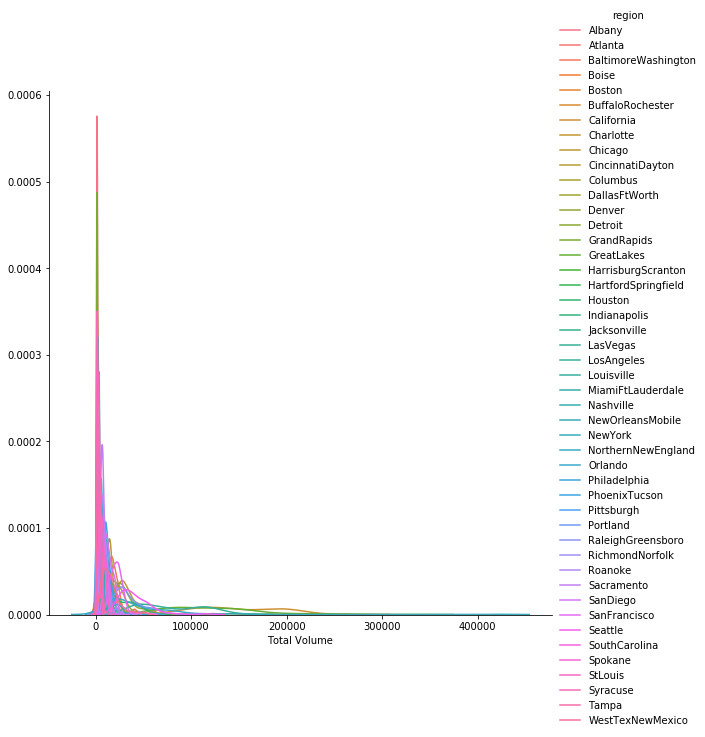

In [111]:
sns.FacetGrid(Analysis[(Analysis.type=="organic")], hue = "region", size = 8).map(sns.kdeplot, "Total Volume").add_legend()
plt.show()


In [112]:
Final.rename(columns={"region":"clusters"},inplace=True)

# Assumption:
    Clusters were formed based on the distibution of the total volume across different states.It explains consumerism in that state and not on the total volume itself.Some states might have less total volume and still be classified as High Consumers because it explains about the overall pattern in that state and not the total volume itself

# Data Aggregation

In [113]:
'''Final1=Final.groupby(by=["mon_year","co-ordinates","region","type"]).agg({"AveragePrice":"mean","Total Volume":"sum","4046":"sum",
              "4225":"sum","4770":"sum", "Total Bags":"sum","Small Bags":"sum","Large Bags":"sum","XLarge Bags":"sum","PPIACO_PC1":"mean",
                                                    "CPIAUCSL_PC1_x":"mean","CPIAUCSL_PC1_y":"mean",'CPILFESL_PC1':"mean",'Unemployment Rate, Percent, Monthly, Seasonally Adjusted':"mean",
                                                   'Employed Population: Aged 15 and Over: All Persons for the United States, Percent Change from Year Ago, Quarterly, Seasonally Adjusted':"mean",
                                                        'GDPC1_LFEMTTTTUSQ647S':"mean"}).reset_index()'''

'Final1=Final.groupby(by=["mon_year","co-ordinates","region","type"]).agg({"AveragePrice":"mean","Total Volume":"sum","4046":"sum",\n              "4225":"sum","4770":"sum", "Total Bags":"sum","Small Bags":"sum","Large Bags":"sum","XLarge Bags":"sum","PPIACO_PC1":"mean",\n                                                    "CPIAUCSL_PC1_x":"mean","CPIAUCSL_PC1_y":"mean",\'CPILFESL_PC1\':"mean",\'Unemployment Rate, Percent, Monthly, Seasonally Adjusted\':"mean",\n                                                   \'Employed Population: Aged 15 and Over: All Persons for the United States, Percent Change from Year Ago, Quarterly, Seasonally Adjusted\':"mean",\n                                                        \'GDPC1_LFEMTTTTUSQ647S\':"mean"}).reset_index()'

In [114]:
#Final1.columns=[("".join(col)).strip(" ") for col in Final1.columns.values]
#Final1["Month_ind"]=Final1["mon_year"].astype(str).str[4:].astype(int)

In [115]:
#Final1= pd.concat([Final1,pd.get_dummies(Final1["Month_ind"], prefix='Month',drop_first=True)],axis=1)
#Final1.drop(["Month_ind"],axis=1, inplace=True)

In [116]:
Final1=pd.read_csv("Temparature_details.csv")
Final2=pd.read_csv("windspeed_data.csv")
Final3=pd.read_csv("moisture_data.csv")

In [117]:
def func_round_off(df,param):
    List=[]
    for i in df[param]:
        try:
            a=tuple(map(float, i.strip("()").split(',')))
            b=(round(a[0],3),round(a[1],3))
        except AttributeError:
            b=np.NaN
        List.append(b)
    df[param]=List

In [118]:
func_round_off(Final,"co-ordinates")
func_round_off(Final1,"co-ordinates")
func_round_off(Final2,"co-ordinates")
func_round_off(Final3,"co-ordinates")

In [119]:
Final=Final.reset_index(drop=True)

In [120]:
Final=Final[~Final["co-ordinates"].isnull()]

In [121]:
Final1=Final1[Final1.mon_year.isin(Final.mon_year.unique())]
Final2=Final2[Final2.mon_year.isin(Final.mon_year.unique())]
Final3=Final3[Final3.mon_year.isin(Final.mon_year.unique())]

In [122]:
#Final_adj=Final[['Small Bags sum', 'Large Bags sum', 'XLarge Bags sum']].transform(func = ['log','sqrt',np.square]).reset_index(drop=True)

In [123]:
#Final_adj.columns=[("".join(col)).strip(" ") for col in Final_adj.columns.values]

In [124]:
Final.mon_year=Final.Date.str[:4]+Final.Date.str[5:7]
Final.mon_year=Final.mon_year.astype("int64")

In [125]:
'''List=[]
for i in range(0,len(Final)):
    try:
        List.append(tuple(round(float(s),4) for s in Final["co-ordinates"].str.strip("()")[i].split(",")))
    except AttributeError:
        List.append(np.NaN)
Final["co-ordinates"]=List'''


'List=[]\nfor i in range(0,len(Final)):\n    try:\n        List.append(tuple(round(float(s),4) for s in Final["co-ordinates"].str.strip("()")[i].split(",")))\n    except AttributeError:\n        List.append(np.NaN)\nFinal["co-ordinates"]=List'

# Feature Scaling

In [126]:
Final2_adj=Final2.select_dtypes([int,float]).transform(func=[np.square,np.sqrt]).reset_index(drop=True)
Final2=pd.concat([Final2.reset_index(drop=True),Final2_adj],axis=1)
Final2.columns=[("".join(col)).strip(" ") for col in Final2.columns.values]


In [127]:
Final3_adj=Final3.select_dtypes([int,float]).transform(func=[np.square,np.sqrt]).reset_index(drop=True)
Final3=pd.concat([Final3.reset_index(drop=True),Final3_adj],axis=1)
Final3.columns=[("".join(col)).strip(" ") for col in Final3.columns.values]

In [128]:
Final2.reset_index(drop=True)
Final3.reset_index(drop=True)

,Unnamed: 0,Precipitation,Surface Pressure,Relative_Humidity at 2 metres,co-ordinates,mon_year,Precipitationsquare,Precipitationsqrt,Surface Pressuresquare,Surface Pressuresqrt,Relative_Humidity at 2 metressquare,Relative_Humidity at 2 metressqrt
0,13,69.05,99.10,84.10,"(42.652, -73.755)",201501,4767.9025,8.309633,9820.8100,9.954898,7072.8100,9.170605
1,14,48.35,99.00,92.21,"(42.652, -73.755)",201502,2337.7225,6.953416,9801.0000,9.949874,8502.6841,9.602604
2,15,34.07,99.10,82.11,"(42.652, -73.755)",201503,1160.7649,5.836951,9820.8100,9.954898,6742.0521,9.061457
3,16,65.99,98.81,76.59,"(42.652, -73.755)",201504,4354.6801,8.123423,9763.4161,9.940322,5866.0281,8.751571
4,17,48.73,99.26,72.47,"(42.652, -73.755)",201505,2374.6129,6.980688,9852.5476,9.962931,5251.9009,8.512931
...,...,...,...,...,...,...,...,...,...,...,...,...
1763,3359,166.53,100.89,77.80,"(29.761, -95.37)",201706,27732.2409,12.904650,10178.7921,10.044401,6052.8400,8.820431
1764,3360,108.52,101.31,73.46,"(29.761, -95.37)",201707,11776.5904,10.417293,10263.7161,10.065287,5396.3716,8.570881
1765,3361,853.74,100.99,78.04,"(29.761, -95.37)",201708,728871.9876,29.218830,10198.9801,10.049378,6090.2416,8.834025
1766,3362,52.01,101.15,78.77,"(29.761, -95.37)",201709,2705.0401,7.211796,10231.3225,10.057336,6204.7129,8.875246


In [129]:
set(Final["co-ordinates"].unique()).difference(Final1["co-ordinates"].unique())

set()

In [130]:
df_final = reduce(lambda left,right: pd.merge(left,right,on=["co-ordinates","mon_year"],how="left"), [Final,Final1,Final2,Final3])

In [131]:
#df_final.drop(columns=['Unnamed: 0_x','Unnamed: 0_y','Unnamed: 0'],inplace=True)

In [132]:
df_final.drop(columns=['Unnamed: 0',
 'Unnamed: 0_x',
 'Unnamed: 0_y'],inplace=True)

In [133]:
#df_final=pd.read_csv("clusters.csv")

In [134]:
df_final=df_final.reset_index(drop=True)

In [135]:
#df_final["Lag1_total_bags"]=df_final.groupby(['type','region'])["Total Bags"].shift(1)

In [136]:
#df_final=df_final.drop(columns=['4046', '4225', '4770',"Small Bags","Large Bags","XLarge Bags","Total Bags"],axis=1)

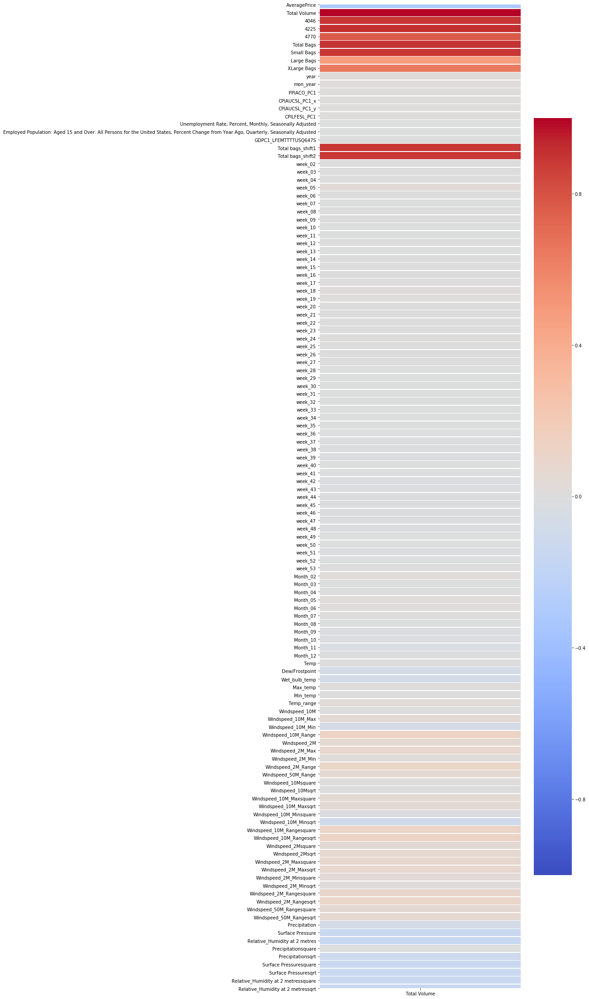

In [137]:
fig, ax = plt.subplots(figsize=(10,40))  
sns.heatmap(data=df_final[df_final.columns[1:]].corr()[['Total Volume']],linewidths=.5,ax=ax,cmap='coolwarm',vmin=-1
           )

In [138]:
#df_final[df_final.columns[1:]].corr()['Total Volume']

In [139]:
df_final['mon_year'] = df_final['mon_year'].apply(lambda x: pd.to_datetime(str(x), format='%Y%m'))

In [143]:
import plotly.express as px
df_final1=df_final[df_final.type=="conventional"]
fig = px.scatter(df_final, x="mon_year", y="Total Volume", color="clusters",
                 size='AveragePrice',opacity=0.6,log_y=True)
fig.show()

In [144]:
df_final["clusters"][df_final.type=="organic"].unique()

array([5.0, 2.0, 1.0, 10.0, 9.0, 7.0, 3.0, 6.0, 0.0, 11.0, 4.0, 8.0],
      dtype=object)

In [146]:
import plotly.express as px
df_final2=df_final[df_final.type=="organic"]
fig = px.scatter(df_final2, x="Date", y="Total Volume", color="clusters",
                 size='AveragePrice',opacity=0.6,log_y=True)
fig.show()

# Feature Creation

In [147]:
def feature_creator(df,type_,region):
    sample=df[(df.type==type_) & (df.clusters==region)].sort_values(by="Date")
    sample1=sample.groupby("Date")["Total bags_shift1"].agg(["std","median"]).reset_index()
    sample2=sample.groupby("Date")["Total bags_shift1"].describe().iloc[:,3:8]
    sample2=sample2.pct_change().reset_index()
    sample1.rename(columns={"Date":"Date","std":"Total bags1_std","median":"Total bags1_median"},inplace=True)
    sample2=sample2.rename(columns=dict(zip(sample2.columns,['Date', 'Total bags.1_min % change', 'Total bags.1_25% change', 'Total bags.1_50% change', 'Total bags.1_75% change','Total bags.1_max % change'])))
    sample=reduce(lambda left,right: pd.merge(left,right,on=["Date"],how="left"), [sample,sample1,sample2])
    sample.drop(columns=['4046', '4225', '4770', 'Total Bags','Small Bags','Large Bags','XLarge Bags','clusters',
 'mon_year','observation_date_y','observation_date_x','CPIAUCSL_PC1_x','LFEMTTTTUSQ647S_PC1','co-ordinates','Year','week','Month','UNRATE'],inplace=True)
    return sample

In [148]:
sample=feature_creator(df_final,type_="organic",region=3)

In [149]:
sample[sample.columns[0:]].corr()['Total Volume'].sort_values(ascending=False).head(15)

Total Volume              1.000000
Total bags_shift1         0.754326
Total bags_shift2         0.718979
Windspeed_2Msqrt          0.711823
Windspeed_2M_Maxsqrt      0.693557
Windspeed_2M              0.689111
Windspeed_2M_Max          0.685535
Windspeed_2M_Minsqrt      0.672866
Windspeed_10M_Maxsqrt     0.658280
Windspeed_10M_Max         0.655146
Windspeed_10Msqrt         0.649299
Windspeed_2M_Rangesqrt    0.646522
Windspeed_10M             0.636472
Windspeed_2M_Range        0.631620
Windspeed_2M_Maxsquare    0.630367
Name: Total Volume, dtype: float64

In [150]:
sample[sample.columns[0:]].corr()['Total Volume'].sort_values(ascending=False).tail(15)

Temp                                                                                                                                     -0.059869
week_43                                                                                                                                  -0.062599
week_42                                                                                                                                  -0.063328
Month_11                                                                                                                                 -0.073839
Month_10                                                                                                                                 -0.101623
Max_temp                                                                                                                                 -0.105343
Wet_bulb_temp                                                                                                         

In [151]:
#sample2[sample2.columns[0:]].corr()['Total Volume'].sort_values(ascending=False).head(15)

In [152]:
import plotly.express as px
fig = px.scatter(sample, x="Date", y="Total Volume",color='type',opacity=0.6,size='AveragePrice')
fig.show()

In [153]:
sample=sample.fillna(0)

In [154]:
sample=sample.groupby("Date").agg("mean").reset_index()

In [155]:
sample["Total Volume"].loc[sample["Total Volume"] > np.percentile(sample["Total Volume"],95)]  = np.percentile(sample["Total Volume"],95)
sample["Total Volume"].loc[sample["Total Volume"] < np.percentile(sample["Total Volume"],5)]  = np.percentile(sample["Total Volume"],5)

In [156]:
#import plotly.express as px
#fig = px.scatter(sample, x="Date", y="Total Volume log",opacity=0.6,size='AveragePrice')
#fig.show()

In [157]:
sample["Total Volume log"]=np.log(sample["Total Volume"])

In [158]:
sample=sample[~sample.isin([np.nan, np.inf, -np.inf]).any(1)]
sample

,Date,AveragePrice,Total Volume,year,PPIACO_PC1,CPIAUCSL_PC1_y,CPILFESL_PC1,"Unemployment Rate, Percent, Monthly, Seasonally Adjusted","Employed Population: Aged 15 and Over: All Persons for the United States, Percent Change from Year Ago, Quarterly, Seasonally Adjusted",GDPC1_LFEMTTTTUSQ647S,...,Relative_Humidity at 2 metressquare,Relative_Humidity at 2 metressqrt,Total bags1_std,Total bags1_median,Total bags.1_min % change,Total bags.1_25% change,Total bags.1_50% change,Total bags.1_75% change,Total bags.1_max % change,Total Volume log
0,2015-01-04,1.3900,45708.59250,2015,-5.78999,-0.22993,1.63163,5.7,1.92369,0.000117,...,6783.289000,8.955148,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,10.730042
1,2015-01-11,1.3625,52024.43250,2015,-5.78999,-0.22993,1.63163,5.7,1.92369,0.000117,...,6783.289000,8.955148,5126.224719,5651.390,0.000000,0.000000,0.000000,0.000000,0.000000,10.859469
2,2015-01-18,1.4275,49454.17250,2015,-5.78999,-0.22993,1.63163,5.7,1.92369,0.000117,...,6783.289000,8.955148,2168.418122,5350.950,0.223780,-0.025151,-0.053162,-0.188958,-0.390939,10.808802
3,2015-01-25,1.4775,39693.06475,2015,-5.78999,-0.22993,1.63163,5.7,1.92369,0.000117,...,6783.289000,8.955148,959.747933,9234.100,0.822835,0.842435,0.725694,0.454143,0.098964,10.588932
4,2015-02-01,1.3225,48340.82250,2015,-7.09772,-0.08703,1.68808,5.5,1.92369,0.000117,...,6329.221725,8.812673,3127.215420,6896.320,-0.476313,-0.419926,-0.253168,-0.070523,0.091280,10.786032
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,2017-09-03,2.4150,68944.74000,2017,4.22686,2.23049,1.68028,4.2,1.39534,0.000118,...,4654.588850,8.161546,44131.816695,23006.315,0.188759,0.254757,-0.206008,-0.173015,0.032801,11.141061
140,2017-09-10,2.4625,63756.08250,2017,4.22686,2.23049,1.68028,4.2,1.39534,0.000118,...,4654.588850,8.161546,49853.257055,24402.310,0.145828,0.144174,0.060679,0.077064,0.125877,11.062820
141,2017-09-17,2.4625,63209.46750,2017,4.22686,2.23049,1.68028,4.2,1.39534,0.000118,...,4654.588850,8.161546,42283.187588,21592.905,-0.139257,-0.103336,-0.115129,-0.137840,-0.146721,11.054209
142,2017-09-24,2.3900,72534.05750,2017,4.22686,2.23049,1.68028,4.2,1.39534,0.000118,...,4654.588850,8.161546,44157.807867,19999.125,-0.068443,-0.137141,-0.073810,-0.000518,0.022965,11.191811


# AUTOMATED MODEL SELECTION AND LINEAR REGRESSION_VARIABLE SELECTION

In [159]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [168]:
def funct(df,dropcols=list(),Target="NULL"):
        def step():
            df_analysis1=df
            X=df_analysis1.drop(columns=dropcols)
            Y=df_analysis1[Target]
            val1=[]
            val=[]
            X1=X.columns
            X1=list(X1)
            List1=[]
            for k in range(1,len(np.ones(40))):
                m=int(np.ones(40)[k])
                List=[]
                for x in combinations(X1, m):
                    x=list(x)
                    if k==1:
                        X_train, X_test, y_train, y_test = train_test_split(X[x], Y, test_size=0.3, random_state=1)
                        X_train = stm.add_constant(X_train)
                        model=stm.OLS(y_train,X_train).fit()
                        if (model.pvalues<0.05).all()==True:
                            List.append([x,model.rsquared])
                            LIOR=x
                    else:
                        X_train, X_test, y_train, y_test = train_test_split(X[x+val1], Y, test_size=0.3, random_state=1)
                        cc = np.corrcoef(X_train, rowvar=False)
                        VIF = np.linalg.inv(cc)
                        VIF_values= dict(zip(X_train.columns, VIF.diagonal()))
                        dict1={i:VIF_values[i] for i in VIF_values if VIF_values[i]<5.0}
                        X_train=X_train[dict1.keys()]
                        X_train = stm.add_constant(X_train)
                        model=stm.OLS(y_train,X_train).fit()
                        if (model.pvalues<0.05).all()==True:
                            if len(list(model.pvalues.index))>=2:
                                if list(model.pvalues.index) not in List1:
                                    List1.append(list(model.pvalues.index))
                            List.append([x,model.rsquared_adj])
                try:
                    val=val+list(max(List, key = lambda i : i[1])[0] )
                    val1.append(*(max(List, key = lambda i : i[1])[0] ))
                    X1=X.columns.drop(labels=val)
                except ValueError as e:
                    pass
                    #print("One of the values exceeds threshold-pvalue for stepwise linear regression")
            inter=0
            if len(List1)==0:
                print("No combinations suits to fit model")
                return(0,0)
            else:
                for i in range(0,len(List1)):
                    val1=[i for i in list(List1[i]) if i!='const']
                    X=df_analysis1
                    #X=X.replace([np.inf, -np.inf,np.NaN], 0)
                    #X = X.dropna()
                    Y=X[Target]
                    X=X.drop(columns=cols)
                    X_train, X_test, y_train, y_test = train_test_split(X[val1], Y, test_size=0.3, random_state=1)
                    #cc = np.corrcoef(X_train, rowvar=False)
                    #VIF = np.linalg.inv(cc)
                    #VIF_values= dict(zip(X_train.columns, VIF.diagonal()))
                    X_train = stm.add_constant(X_train)
                    X_test= stm.add_constant(X_test)
                    model=stm.OLS(y_train,X_train).fit()
                    if model.rsquared_adj>inter:
                        inter,ind=(model.rsquared_adj,i)
                try:
                    val1=[i for i in List1[ind] if i!="const"]
                    X=df_analysis1
                    Y=X[Target]
                    X=X.drop(columns=cols)
                    X_train, X_test, y_train, y_test = train_test_split(X[val1], Y, test_size=0.3, random_state=1)
                    X_train = stm.add_constant(X_train)
                    X_test = stm.add_constant(X_test)
                    model=stm.OLS(y_train,X_train).fit()
                    #print("VIF values are:")
                    #print(pd.DataFrame([variance_inflation_factor(X_train.values[1:], i) for i in range(1,X_train.shape[1])], index=X_train.columns[1:],columns=["VIF"]))
                    predictions=model.predict(X_test)
                    print(mean_absolute_percentage_error(y_train,model.predict(X_train)))
                    error=mean_absolute_percentage_error(y_test,predictions)
                    print("MAPE-",error)
                    R2_test=(1-((y_test - predictions) ** 2).sum()/((predictions - y_test.mean()) ** 2).sum())
                    #white_test = stm.stats.diagnostic.het_white(model.resid, exog= model.model.exog)
                    het_breuschpagan=stm.stats.diagnostic.het_breuschpagan(model.resid, exog_het=model.model.exog)
                    #print(val)
                    if(het_breuschpagan[1]>0.05):
                        Homo=True
                    else:
                        Homo=False
                    stat, p = normaltest(model.resid)
                    if p>0.05:
                        std=True
                    else:
                        std=False
                    flagger=np.mean(model.resid)
                    #print(flagger,std,Homo)
                    if(int(flagger)==0) & (std==Homo==True):
                        print("All assumptions passed")
                        return(error,1)
                    else:
                        print("Refit the model by changing predictors or do transformation")
                        return(0,0)
                except IndexError as e:
                    val1=LIOR
                    X=df_analysis1
                    Y=X[Target]
                    X=X.drop(columns=cols)
                    X_train, X_test, y_train, y_test = train_test_split(X[val1,"type"], Y, test_size=0.3, random_state=1)
                    X_train = stm.add_constant(X_train)
                    X_test = stm.add_constant(X_test)
                    model=stm.OLS(y_train,X_train).fit()
                    #print(model.summary())
                    predictions=model.predict(X_test)
                    error=mean_absolute_percentage_error(y_test,predictions)
                    print("MAPE-",error)
                    #model assumptions
                    #white_test = stm.stats.diagnostic.het_white(model.resid, exog= model.model.exog)
                    het_breuschpagan=stm.stats.diagnostic.het_breuschpagan(model.resid, exog_het=model.model.exog)
                    if(het_breuschpagan[1]>0.05):
                        Homo=True
                    else:
                        Homo=False
                    stat, p = normaltest(model.resid)
                    if p>0.05:
                        std=True
                    else:
                        std=False
                    flagger=np.mean(model.resid)
                    if(int(flagger)==0) & (std==Homo==True):
                        print("All assumptions passed")
                        return(error,1)
                    else:
                        print("Refit the model by changing predictors or do transformation")
                        return (0,0)
        def lasso():
            df_analysis1=df
            X=df_analysis1.drop(columns=dropcols)
            Y=df_analysis1[Target]
            X = X.dropna().assign(Intercept=1)
            #X=scalar.fit_transform(X)
            #Y=scalar.fit_transform(np.array(Y).reshape(-1,1))
            X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)
            model = Lasso(max_iter=1000,tol=0.001,normalize=True)
            params={"alpha":[1e-15,1e-10,1e-8,1e-4,1e-3,1e-2,1,5,10,20,25,50,100]}
            lasso_reg=GridSearchCV(model,params,cv=4,scoring=None)
            lasso_reg.fit(X_train,y_train)
            y_train_lass= lasso_reg.predict(X_train)
            y_pred_lass= lasso_reg.predict(X_test)
            #print(lasso_reg.best_params_)
            #print(lasso_reg.best_estimator_.coef_)
            coeff_used = np.sum(lasso_reg.best_estimator_.coef_!=0)
            #y_test=np.array(y_test).reshape(1,-1)
            R2_train=(1-((y_train - y_train_lass) ** 2).sum()/((y_train_lass - y_train.mean()) ** 2).sum())
            R2_test=(1-((y_test - y_pred_lass) ** 2).sum()/((y_pred_lass - y_test.mean()) ** 2).sum())
            error=mean_absolute_percentage_error(y_test,y_pred_lass)
            resid=(y_train-y_train_lass)
            #white_test = stm.stats.diagnostic.het_white(resid, exog=np.array(X_train))
            het_breuschpagan=stm.stats.diagnostic.het_breuschpagan(resid, exog_het=np.array(X_train))
            if((het_breuschpagan[1]>0.05)):
                Homo=True
            else:
                Homo=False
            stat, p = normaltest(resid)
            if p>0.05:
                std=True
            else:
                std=False
            flagger=np.mean(resid)
            print("MAPE-",error)
            #print(flagger,std,Homo)
            if(int(flagger)==0) & (std==Homo==True):
                print("All assumptions passed")
                return(error,2)
            else:
                print("Refit the model by changing predictors or do transformation")
                return(0,0)
        def decision_tree():
            df_analysis1=df
            X=df_analysis1.drop(columns=dropcols)
            Y=df_analysis1[Target]
            #X = X.assign(Intercept=1)
            #X=scalar.fit_transform(X)
            #Y=scalar.fit_transform(np.array(Y).reshape(-1,1))
            scoring = make_scorer(r2_score)
            X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)
            g_cv = GridSearchCV(DecisionTreeRegressor(criterion="friedman_mse",random_state=1),
                          param_grid={'min_samples_split': range(2, 10),'max_depth':range(1,12)},
                          scoring=scoring, cv=5, refit=True)
            g_cv.fit(X_train, y_train)
            #print(g_cv.best_params_)
            result = g_cv.cv_results_
            Trainr2=r2_score(y_train, g_cv.best_estimator_.predict(X_train))
            Testr2=r2_score(y_test, g_cv.best_estimator_.predict(X_test))
            #model=DecisionTreeRegressor(criterion="friedman_mse",max_depth=3)
            #reg=model.fit(X_train,y_train)
            #pred= reg.predict(X_test)
            #print(mean_absolute_percentage_error(y_train,g_cv.best_estimator_.predict(X_train)))
            error=mean_absolute_percentage_error(y_test,g_cv.best_estimator_.predict(X_test))
            print("MAPE-",error)
            #tree.plot_tree(reg,feature_names = list(X_train.columns),filled=True)
            return(error,3)
        a=min(step(),lasso(),decision_tree())
        print(a)
        if a!=(0,0):
            print("Selected model has MAPE",a[0],"and the model number is ",a[1])
        if a==(0,0):
            print("One or more of the models is incorrect!!!please refit and try again")

In [169]:
cols=['year','Date','Total Volume',"Total Volume log"]

Target="Total Volume"


In [170]:
funct(df=sample,dropcols=cols,Target=Target)


7.899809721145585
MAPE- 9.42844903149888
All assumptions passed
MAPE- 10.83039761163004
All assumptions passed
MAPE- 15.51123138069814
(9.42844903149888, 1)
Selected model has MAPE 9.42844903149888 and the model number is  1


In [102]:
features=['Total bags_shift1', 'AveragePrice', 'Windspeed_10M_Minsquare', 'Unemployment Rate, Percent, Monthly, Seasonally Adjusted', 'Total bags1_std', 'PPIACO_PC1', 'week_52', 'week_14', 'Total bags.1_max % change', 'GDPC1_LFEMTTTTUSQ647S', 'week_28', 'CPIAUCSL_PC1_y', 'CPILFESL_PC1', 'Employed Population: Aged 15 and Over: All Persons for the United States, Percent Change from Year Ago, Quarterly, Seasonally Adjusted', 'Total bags_shift2', 'week_02', 'week_03', 'week_04', 'week_05', 'week_06', 'week_07', 'week_08', 'week_09', 'week_10', 'week_11', 'week_12', 'week_13', 'week_15', 'week_16', 'week_17', 'week_18', 'week_19', 'week_20', 'week_21', 'week_22', 'week_23', 'week_24', 'week_25', 'week_26']
X_train, X_test, y_train, y_test = train_test_split(sample[features], sample["Total Volume"], test_size=0.3, random_state=1)
X_train = stm.add_constant(X_train)
X_test = stm.add_constant(X_test)
model=stm.OLS(y_train,X_train).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           Total Volume   R-squared:                       0.933
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     21.90
Date:                Thu, 07 May 2020   Prob (F-statistic):           1.47e-23
Time:                        11:39:31   Log-Likelihood:                -980.80
No. Observations:                  99   AIC:                             2040.
Df Residuals:                      60   BIC:                             2141.
Df Model:                          38                                         
Covariance Type:            nonrobust                                         
==========================================================================================================================================================================================================
                                                                                                                                             coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                                   1.521e+06   5.91e+05      2.572      0.013    3.38e+05     2.7e+06
Total bags_shift1                                                                                                                         -0.1108      0.113     -0.984      0.329      -0.336       0.114
AveragePrice                                                                                                                           -3.612e+04   4586.238     -7.876      0.000   -4.53e+04   -2.69e+04
Windspeed_10M_Minsquare                                                                                                                -4701.5033    843.125     -5.576      0.000   -6388.005   -3015.002
Unemployment Rate, Percent, Monthly, Seasonally Adjusted                                                                                -2.89e+04   5477.458     -5.275      0.000   -3.99e+04   -1.79e+04
Total bags1_std                                                                                                                            0.4508      0.091      4.974      0.000       0.270       0.632
PPIACO_PC1                                                                                                                              4457.3261    969.726      4.596      0.000    2517.585    6397.067
week_52                                                                                                                                -9123.7423   4833.600     -1.888      0.064   -1.88e+04     544.898
week_14                                                                                                                                 1.811e+04   5040.528      3.593      0.001    8028.293    2.82e+04
Total bags.1_max % change                                                                                                              -6069.6709   2383.982     -2.546      0.013   -1.08e+04   -1300.997
GDPC1_LFEMTTTTUSQ647S                                                                                                                   -1.05e+10   4.92e+09     -2.133      0.037   -2.04e+10   -6.55e+08
week_28                                                                                                                                   -0.5788      0.271     -2.133      0.037      -1.122      -0.036
CPIAUCSL_PC1_y                        

In [103]:
from sklearn.feature_selection import f_regression

In [104]:
Feature_imp=f_regression(X_train,y_train,center=True)
Feature_imp

(array([           nan, 1.42325910e+02, 1.01289557e+01, 3.12653105e+00,
        6.67258828e+01, 5.26083281e+01, 6.99120139e+01, 8.82950492e-01,
        3.30574029e-01, 4.71559732e-02, 9.75969142e+00,            nan,
        7.80325827e+01, 1.00584277e+01, 2.58409772e+01, 1.20992300e+02,
        5.83580082e-01, 1.16069535e-01, 8.33210605e-01, 6.36816471e-02,
        4.93620351e-01, 1.94302462e+00, 1.40928668e-01, 1.64481031e+00,
        1.24883940e+00, 6.40167239e-01, 7.60484116e-01, 4.66518764e-02,
        4.09667627e+00, 2.07759462e-02, 2.01964540e+00, 3.22256681e+00,
        1.00869559e+00, 1.66403032e+00, 8.56990469e-01, 1.33853950e+00,
        1.31688468e+00, 1.88903816e-01, 8.01294357e-03, 1.94909785e-01]),
 array([           nan, 9.88039666e-21, 1.96158069e-03, 8.01714884e-02,
        1.17468500e-12, 9.99332898e-11, 4.55294584e-13, 3.49728888e-01,
        5.66652489e-01, 8.28544230e-01, 2.35249997e-03,            nan,
        4.41289514e-14, 2.03068987e-03, 1.80330908e-06, 9.4593

In [105]:
dict1=pd.DataFrame((X_train.columns,Feature_imp[0])).T
dict1.columns=["Features","Importance"]
dict1=dict1.sort_values("Importance",ascending=False)[:13]

In [106]:
px.bar(dict1, x='Features', y='Importance',height=800,width=800)

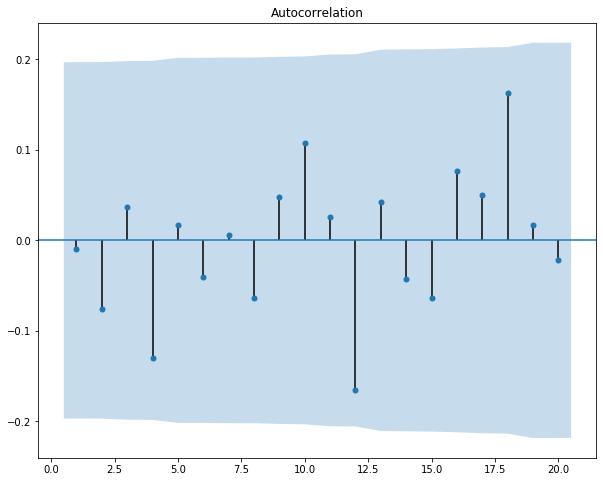

In [107]:
from statsmodels.graphics.tsaplots import plot_acf
#
fig = plt.figure(num = 1, figsize = (10, 8))
_ = plot_acf(model.resid, lags = 20, zero = False, ax = fig.add_subplot(111))
plt.show()

In [108]:
import statsmodels.stats.stattools as sm_tools
#
print(sm_tools.durbin_watson(model.resid))

2.0087942197547366


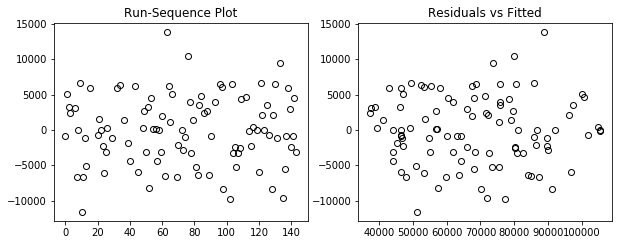

In [109]:
import matplotlib.pyplot as plt
#
fig = plt.figure(num = 0, figsize = (10, 8))
plot_opts = dict(linestyle = "None", marker = "o", color = "black", markerfacecolor = "None")
_ = fig.add_subplot(2, 2, 1).plot(model.resid, **plot_opts)
_ = plt.title("Run-Sequence Plot")
_ = fig.add_subplot(2, 2, 2).plot(model.fittedvalues, model.resid, **plot_opts)
_ = plt.title("Residuals vs Fitted")

In [110]:
model.diagn

{'jb': 0.3093055682383299,
 'jbpv': 0.8567125900640216,
 'skew': 0.030267982262980275,
 'kurtosis': 2.7329446404644,
 'omni': 0.13166979656248862,
 'omnipv': 0.9362854338657938,
 'condno': 1.1833284469878926e+16,
 'mineigval': 2.3788914131590893e-21}

In [111]:
BP_t = stm.stats.diagnostic.het_breuschpagan(resid = model.resid, exog_het = model.model.exog)
print(pd.DataFrame(zip(['LM statistic', 'p-value',  'F-value', 'F: p-value'], BP_t)))

              0          1
0  LM statistic  51.356588
1       p-value   0.088900
2       F-value   1.702006
3    F: p-value   0.031994


# OOB validation

In [112]:
Analysis=OOB

In [113]:
List=[]
for i in (list(Analysis.region.unique())):
    summary=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="organic")].describe()[1]
    summary_=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="organic")].describe()[2]
    summary_1=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="organic")].describe()[4]
    summary_2=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="organic")].describe()[5]
    summary_3=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="organic")].describe()[6]
    #summary_4=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="conventional")].describe()[6]
    #summary_5=Analysis["Total Volume"][(Analysis.region==i) & (Analysis.type=="conventional")].describe()[7]
    meanplus3sd=summary+3*summary_
    meanminus3d=summary-3*summary_
    List.append([summary,summary_,summary_1,summary_2,summary_3,meanplus3sd
                 ,meanminus3d,i])
List=sorted(List)

In [114]:
df=pd.DataFrame(List,columns=["mean","std","Q1","median","Q3","meanplus3d","meanminus3d","region"])


In [116]:
to_find_similarity=df1[df1.clusters==3].iloc[:,0:7]
cols=to_find_similarity.columns

,mean,std,Q1,median,Q3,meanplus3d,meanminus3d
40,33925.144895,16090.312525,24285.2900,29446.62,42212.060,82196.082469,-14345.792679
42,40019.449161,16443.561699,28469.3600,37079.86,48281.175,89350.134259,-9311.235937
44,78410.140278,32789.786898,45650.3475,72445.64,109784.805,176779.500971,-19959.220415
45,119324.186154,47044.588771,82163.1600,112979.93,147793.335,260457.952466,-21809.580159


In [119]:
to_find_similarity1=scaler.fit_transform(to_find_similarity)
df_a=pd.DataFrame(to_find_similarity1,columns=cols)

In [125]:
df_test=df1.iloc[:,:-2].reset_index(drop=True)
cols=df_test.columns
df_test1=scaler.fit_transform(df_test)
df_b=pd.DataFrame(df_test1,columns=cols)
df_test

,mean,std,Q1,median,Q3,meanplus3d,meanminus3d
0,2178.571944,1239.224180,1284.7675,1918.130,2807.3750,5896.244485,-1539.100596
1,2463.612778,1331.859352,1454.1075,2177.080,3087.7525,6459.190833,-1531.965278
2,3758.633611,1933.677599,2096.8425,3620.860,4999.9875,9559.666408,-2042.399186
3,8183.459580,3386.817245,5171.1800,8170.130,10777.0950,18343.911316,-1976.992155
4,8419.398472,3461.113323,5618.3700,7967.105,10763.2450,18802.738441,-1963.941497
5,11044.539792,4439.452026,8023.2025,9855.655,13185.9650,24362.895869,-2273.816285
6,6188.104825,2622.749057,3860.7950,5664.830,8599.8250,14056.351995,-1680.142345
7,4828.945944,1912.242603,3049.7000,4640.870,6229.7600,10565.673753,-907.781865
8,13804.829028,4173.700204,10453.6875,12861.020,16976.0725,26325.929638,1283.728417
9,8233.807222,3670.847069,5835.5975,7567.035,9755.7725,19246.348429,-2778.733984


In [126]:
fin1=pd.concat([df_a,df_b],axis=0).reset_index(drop=True)

In [128]:
import numpy as np
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KDTree
import numpy as np
kdt = KDTree(fin1, leaf_size=30, metric='manhattan')
kdt.query(fin1, k=3, return_distance=False)[:4]

array([[ 0,  1, 26],
       [ 1,  0, 26],
       [ 2, 30, 31],
       [ 3, 22, 21]], dtype=int64)

In [129]:
df=df.reset_index(drop=True).iloc[[22,26,18],:]

In [130]:
df

,mean,std,Q1,median,Q3,meanplus3d,meanminus3d,region
22,14131.031600,2984.035794,11837.2000,13514.360,16925.6200,23083.138983,5178.924217,PhoenixTucson
26,14933.136154,2933.199060,13738.6875,15416.795,16693.7475,23732.733333,6133.538975,WestTexNewMexico
18,11837.371923,4161.317920,9588.5100,11407.285,12320.9175,24321.325684,-646.581838,Charlotte


In [162]:
Finaldf_toanalyse=OOB[(OOB.region.isin(["PhoenixTucson","WestTexNewMexico","Charlotte"])) & (OOB.type=="organic")]

In [163]:
#set(Finaldf_toanalyse["co-ordinates"].unique()).difference(set(Final3["co-ordinates"].unique()))

In [164]:
Final1=pd.read_csv("Temparature_details.csv")
Final2=pd.read_csv("windspeed_data.csv")
Final3=pd.read_csv("moisture_data.csv")

In [165]:
func_round_off(Finaldf_toanalyse,"co-ordinates")
func_round_off(Final1,"co-ordinates")
func_round_off(Final2,"co-ordinates")
func_round_off(Final3,"co-ordinates")

In [166]:
OOB1=Finaldf_toanalyse
OOB1.mon_year=OOB1.Date.str[:4]+OOB1.Date.str[5:7]
OOB1.mon_year=OOB1.mon_year.astype("int64")

In [167]:
Final2_adj=Final2.select_dtypes([int,float]).transform(func=[np.square,np.sqrt]).reset_index(drop=True)
Final2=pd.concat([Final2.reset_index(drop=True),Final2_adj],axis=1)
Final2.columns=[("".join(col)).strip(" ") for col in Final2.columns.values]
Final3_adj=Final3.select_dtypes([int,float]).transform(func=[np.square,np.sqrt]).reset_index(drop=True)
Final3=pd.concat([Final3.reset_index(drop=True),Final3_adj],axis=1)
Final3.columns=[("".join(col)).strip(" ") for col in Final3.columns.values]

In [168]:
OOB1=OOB1.reset_index()
Final1=Final1.reset_index()
Final2=Final2.reset_index()
Final3=Final3.reset_index()

In [169]:
OOB1=OOB1.sort_values(by="Date")
sample1=OOB1.groupby("Date")["Total bags_shift1"].agg(["std","median"]).reset_index()
sample2=OOB1.groupby("Date")["Total bags_shift1"].describe().iloc[:,3:8]
sample2=sample2.pct_change().reset_index()
sample1.rename(columns={"Date":"Date","std":"Total bags1_std","median":"Total bags1_median"},inplace=True)
sample2=sample2.rename(columns=dict(zip(sample2.columns,['Date', 'Total bags.1_min % change', 'Total bags.1_25% change', 'Total bags.1_50% change', 'Total bags.1_75% change','Total bags.1_max % change'])))
OOB1=reduce(lambda left,right: pd.merge(left,right,on=["Date"],how="left"), [OOB1,sample1,sample2])
OOB1.reset_index(drop=True)

,index,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,...,Month_10,Month_11,Month_12,Total bags1_std,Total bags1_median,Total bags.1_min % change,Total bags.1_25% change,Total bags.1_50% change,Total bags.1_75% change,Total bags.1_max % change
0,13506,2017-10-01,2.82,8276.33,12.62,4182.38,174.37,3906.96,3656.44,250.52,...,1,0,0,141.902189,5849.41,NaN,NaN,NaN,NaN,NaN
1,13515,2017-10-01,2.37,8873.32,1474.43,1689.97,0.00,5708.92,5639.42,69.50,...,1,0,0,141.902189,5849.41,NaN,NaN,NaN,NaN,NaN
2,13540,2017-10-08,1.78,11837.20,2749.91,124.43,0.00,8962.86,8921.88,40.98,...,1,0,0,2210.847089,5708.92,-0.320419,-0.170936,-0.024018,0.187690,0.395828
3,13569,2017-10-08,2.67,9398.69,30.60,3911.27,130.82,5326.00,5147.98,178.02,...,1,0,0,2210.847089,5708.92,-0.320419,-0.170936,-0.024018,0.187690,0.395828
4,13616,2017-10-08,2.39,10964.67,1952.20,2235.24,0.00,6777.23,6542.72,234.51,...,1,0,0,2210.847089,5708.92,-0.320419,-0.170936,-0.024018,0.187690,0.395828
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,15729,2018-03-18,1.54,15639.44,2130.06,3421.21,0.00,10088.17,10065.03,23.14,...,0,0,0,5102.418666,12309.48,0.317876,0.270327,0.246276,0.235400,0.227533
73,15779,2018-03-18,1.75,11986.57,30.26,5808.91,205.67,5941.73,5801.28,140.45,...,0,0,0,5102.418666,12309.48,0.317876,0.270327,0.246276,0.235400,0.227533
74,15848,2018-03-25,1.77,12030.96,17.85,5964.29,161.23,5887.59,5792.37,95.22,...,0,0,0,3246.207292,10088.17,-0.097578,-0.151573,-0.180455,-0.228481,-0.263748
75,15827,2018-03-25,1.52,15372.80,2399.71,3164.80,0.00,9808.29,9789.70,18.59,...,0,0,0,3246.207292,10088.17,-0.097578,-0.151573,-0.180455,-0.228481,-0.263748


In [170]:
final_analysis = reduce(lambda left,right: pd.merge(left,right,on=["co-ordinates","mon_year"],how="left"), [OOB1,Final1,Final2,Final3])

In [174]:
final_analysis=final_analysis.fillna(0)

In [180]:
features=['Total bags_shift1', 'AveragePrice', 'Windspeed_10M_Minsquare', 'Unemployment Rate, Percent, Monthly, Seasonally Adjusted', 'Total bags1_std', 'PPIACO_PC1', 'week_52', 'week_14', 'Total bags.1_max % change', 'GDPC1_LFEMTTTTUSQ647S', 'week_28', 'CPIAUCSL_PC1_y', 'CPILFESL_PC1', 'Employed Population: Aged 15 and Over: All Persons for the United States, Percent Change from Year Ago, Quarterly, Seasonally Adjusted', 'Total bags_shift2', 'week_02', 'week_03', 'week_04', 'week_05', 'week_06', 'week_07', 'week_08', 'week_09', 'week_10', 'week_11', 'week_12', 'week_13', 'week_15', 'week_16', 'week_17', 'week_18', 'week_19', 'week_20', 'week_21', 'week_22', 'week_23', 'week_24', 'week_25', 'week_26']
X_train, X_test, y_train, y_test = train_test_split(final_analysis[features], final_analysis["Total Volume"], test_size=0.30, random_state=1)
X_train = stm.add_constant(X_train)
X_test = stm.add_constant(X_test)
model=stm.OLS(y_train,X_train).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           Total Volume   R-squared:                       0.827
Model:                            OLS   Adj. R-squared:                  0.718
Method:                 Least Squares   F-statistic:                     7.630
Date:                Thu, 07 May 2020   Prob (F-statistic):           2.75e-07
Time:                        11:50:49   Log-Likelihood:                -458.69
No. Observations:                  53   AIC:                             959.4
Df Residuals:                      32   BIC:                             1001.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
==========================================================================================================================================================================================================
                                                                                                                                             coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                                    599.9713   1012.811      0.592      0.558   -1463.058    2663.000
Total bags_shift1                                                                                                                          0.5300      0.206      2.574      0.015       0.111       0.949
AveragePrice                                                                                                                           -3645.4875   1649.508     -2.210      0.034   -7005.425    -285.550
Windspeed_10M_Minsquare                                                                                                                  223.5845    240.165      0.931      0.359    -265.616     712.785
Unemployment Rate, Percent, Monthly, Seasonally Adjusted                                                                                3697.3276   1709.529      2.163      0.038     215.130    7179.525
Total bags1_std                                                                                                                            0.2106      0.514      0.410      0.685      -0.836       1.257
PPIACO_PC1                                                                                                                             -3192.6801   2382.460     -1.340      0.190   -8045.592    1660.232
week_52                                                                                                                                 -848.7648   1537.780     -0.552      0.585   -3981.121    2283.592
week_14                                                                                                                                -5.927e-12    1.1e-11     -0.539      0.594   -2.83e-11    1.65e-11
Total bags.1_max % change                                                                                                               -503.2695   2360.119     -0.213      0.832   -5310.674    4304.135
GDPC1_LFEMTTTTUSQ647S                                                                                                                      0.0713      0.121      0.588      0.561      -0.176       0.318
week_28                                                                                                                                -8.881e-12    1.9e-11     -0.467      0.644   -4.76e-11    2.98e-11
CPIAUCSL_PC1_y                        

In [181]:
Feature_imp=f_regression(X_train,y_train,center=True)
Feature_imp

(array([           nan, 6.17853544e+01, 5.37876112e+01, 1.73815070e+00,
        8.14920414e+00, 1.46189251e+01, 1.17245588e+01, 1.93681245e-01,
                   nan, 3.03565144e-06, 2.38050209e+01,            nan,
        1.12819453e+01, 9.04901092e+00, 2.38050207e+01, 2.30373699e+01,
        6.63275809e-01, 1.40781516e-01, 8.89183015e-02, 5.21067385e-01,
        2.86613269e+00, 2.21545608e+00, 5.55022649e+00, 5.40381868e-01,
        8.76408378e+00, 1.97898774e-02,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan]),
 array([           nan, 2.40312839e-10, 1.61627218e-09, 1.93263766e-01,
        6.21364859e-03, 3.59603257e-04, 1.22508120e-03, 6.61729806e-01,
                   nan, 9.98616634e-01, 1.08731005e-05,            nan,
        1.48722368e-03, 4.07530084e-03, 1.08731011e-05, 1.4287

In [182]:
dict1=pd.DataFrame((X_train.columns,Feature_imp[0])).T
dict1.columns=["Features","Importance"]
dict1=dict1.sort_values("Importance",ascending=False)[:13]

In [183]:
px.bar(dict1, x='Features', y='Importance',height=800,width=800)

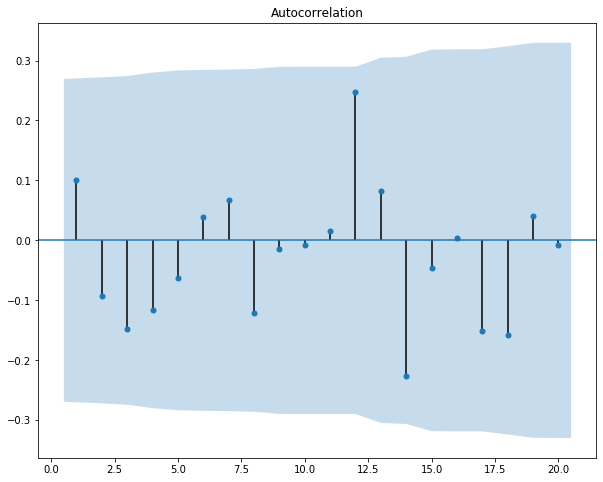

In [184]:
from statsmodels.graphics.tsaplots import plot_acf
#
fig = plt.figure(num = 1, figsize = (10, 8))
_ = plot_acf(model.resid, lags = 20, zero = False, ax = fig.add_subplot(111))
plt.show()

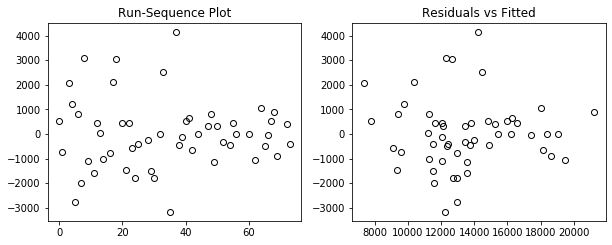

In [185]:
import matplotlib.pyplot as plt
#
fig = plt.figure(num = 0, figsize = (10, 8))
plot_opts = dict(linestyle = "None", marker = "o", color = "black", markerfacecolor = "None")
_ = fig.add_subplot(2, 2, 1).plot(model.resid, **plot_opts)
_ = plt.title("Run-Sequence Plot")
_ = fig.add_subplot(2, 2, 2).plot(model.fittedvalues, model.resid, **plot_opts)
_ = plt.title("Residuals vs Fitted")

In [186]:
BP_t = stm.stats.diagnostic.het_breuschpagan(resid = model.resid, exog_het = model.model.exog)
print(pd.DataFrame(zip(['LM statistic', 'p-value',  'F-value', 'F: p-value'], BP_t)))

              0          1
0  LM statistic  24.512020
1       p-value   0.966025
2       F-value   1.376694
3    F: p-value   0.204812


In [187]:
np.mean(model.resid)

1.5702597628883525e-08

In [2]:
import os

In [3]:
os.getcwd()

'C:\\Users\\thambu'